In [1]:
import os
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import h5py
import scipy.sparse as sp
import yaml

import rmm
import cupy as cp
from rmm.allocators.cupy import rmm_cupy_allocator

import psutil
import torch
from datetime import datetime

import anndata as an
import scanpy as sc
import rapids_singlecell as rsc
import scvi

sc.settings.verbosity = 3

/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_categorical_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/docrep/decorators.py:43: SyntaxWarning: 'param_continuous_covariate_keys' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)


# Memory Management

In [2]:
# Enable `managed_memory`
rmm.reinitialize(
    managed_memory=True,
    pool_allocator=False,
)
cp.cuda.set_allocator(rmm_cupy_allocator)

In [3]:
def print_memory_usage():
    now = datetime.now().strftime('%Y-%m-%d %H:%M:%S')
    print(f"[{now}] Memory Report:")
    
    # RAM usage
    ram = psutil.virtual_memory()
    ram_used_gb = ram.used / 1e9
    print(f"  • RAM used:     {ram_used_gb:.2f} GB")

    # GPU usage
    if torch.cuda.is_available():
        gpu_mem = torch.cuda.memory_allocated() / 1e9
        print(f"  • GPU RAM used: {gpu_mem:.2f} GB")
    else:
        print("  • GPU not available or not using PyTorch CUDA backend.")

print_memory_usage()

[2025-04-04 12:22:49] Memory Report:
  • RAM used:     16.86 GB
  • GPU RAM used: 0.00 GB


# Load the data

In [4]:
dpath = "/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/"

file_list = glob.glob(f"{dpath}hsc_a*/*.h5ad")
file_list

['/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_aux/lymphoid_cells.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/hsc_and_progenitors.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/fibroblasts.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/mesenchymal_cells.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/myeloid_cells.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/innate_lymphoid_cells.h5ad',
 '/nfs/turbo/umms-indikar/shared/projects/czi_projects/data/hsc_anndata/endothelial_cells.h5ad']

In [5]:
def load_first_n_cells(file: str, n: int) -> an.AnnData:
    with h5py.File(file, 'r') as f:
        if isinstance(f['X'], h5py.Group):  # likely sparse
            data = f['X/data'][:]
            indices = f['X/indices'][:]
            indptr = f['X/indptr'][:n+1]  # one extra for CSR row pointer
            shape = (n, f['X'].attrs['shape'][1])

            data = data[:indptr[-1]]  # only use data for first n rows
            indices = indices[:indptr[-1]]

            X_slice = sp.csr_matrix((data, indices, indptr), shape=shape)
        else:
            X_slice = f['X'][:n]

    backed = an.read_h5ad(file, backed='r')
    obs = backed.obs.iloc[:n].copy()
    var = backed.var.copy()
    backed.file.close()

    return an.AnnData(X=X_slice, obs=obs, var=var)

In [6]:
sample_size = 200000
adata_list = []

for fpath in file_list:
    basename = os.path.basename(fpath).replace(".h5ad", "")
    print(f"Working {basename}...")
    adata = sc.read_h5ad(fpath)
    # adata = read_top_n_anndata(fpath, sample_size)
    print(f"\t {len(adata)} Cells")
    adata.obs['basename'] = basename
    adata.var_names = adata.var['feature_name']

    if not sample_size is None:
        if sample_size >= len(adata):
            print(f"\tTaking all cells")
        else:
            print(f"\tSampled {sample_size} ({(sample_size / len(adata)) * 100:.2f}%)")
            adata = sc.pp.sample(adata, n=sample_size, copy=True)
    
    adata_list.append(adata)
    # break

adata = an.concat(adata_list)
adata.obs['dataset_id_int'] = adata.obs['dataset_id'].astype('category').cat.codes
adata.obs['basename'].value_counts()
print()
adata

Working lymphoid_cells...
	 3761959 Cells
	Sampled 200000 (5.32%)
Working hsc_and_progenitors...
	 66394 Cells
	Taking all cells
Working fibroblasts...
	 1277902 Cells
	Sampled 200000 (15.65%)
Working mesenchymal_cells...
	 650601 Cells
	Sampled 200000 (30.74%)
Working myeloid_cells...
	 1147059 Cells
	Sampled 200000 (17.44%)
Working innate_lymphoid_cells...
	 15277 Cells
	Taking all cells
Working endothelial_cells...
	 1043398 Cells
	Sampled 200000 (19.17%)



/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 1081671 × 60530
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int'

In [7]:
sc.logging.print_memory_usage()
print_memory_usage()

Memory usage: current 30.79 GB, difference +30.79 GB
[2025-04-04 12:31:24] Memory Report:
  • RAM used:     49.57 GB
  • GPU RAM used: 0.00 GB


# Basic filtering and processing

In [8]:
rsc.get.anndata_to_GPU(adata)
rsc.pp.filter_cells(adata, min_counts=200)
rsc.pp.filter_genes(adata, min_counts=50)

adata.layers['counts'] = adata.X.get()

rsc.pp.normalize_total(adata, target_sum=1e4)
rsc.pp.log1p(adata)

rsc.get.anndata_to_GPU(adata) # move to GPU
adata

filtered out 181 cells that have less than 200 counts


/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


filtered out 17088 genes that are detected in less than 50 counts


/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 1081490 × 43442
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int', 'n_counts', 'n_genes'
    var: 'n_counts', 'n_cells'
    uns: 'log1p'
    layers: 'counts'

In [9]:
sc.logging.print_memory_usage()
print_memory_usage()

Memory usage: current 46.87 GB, difference +16.08 GB
[2025-04-04 12:32:04] Memory Report:
  • RAM used:     50.09 GB
  • GPU RAM used: 0.00 GB


# Cell type simplification

In [10]:
# Load YAML into a dictionary
with open("../resources/cell_map.yaml", "r") as file:
    cell_map = yaml.safe_load(file)

adata.obs['cell_type_simplified'] = adata.obs['cell_type'].map(cell_map)

# drop nan - unmappable
adata = adata[adata.obs['cell_type_simplified'].notna(), :].copy()

adata.obs['cell_type_simplified'].value_counts(dropna=False)

/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


cell_type_simplified
Fibroblast                 199999
Endothelial Cell           199985
Mesenchymal Other          179133
T Cell CD4+                 79927
Progenitor Cell             74628
Monocyte                    60756
Macrophage                  56371
T Cell CD8+                 39741
Erythrocyte                 31458
Smooth Muscle Cell          20862
Dendritic Cell              19256
ILC                         15277
B Cell Naive                14988
NK Cell                     13992
Thymocyte                   13004
T Cell Other                12460
B Cell Memory                9457
Neutrophil                   8647
B Cell Other/Developing      7950
Megakaryocyte/Platelet       7465
Mast Cell                    7400
B Cell Plasma                7243
Lymphocyte                    841
T Cell Regulatory             376
Eosinophil/Basophil           271
Name: count, dtype: int64

In [11]:
# drop nan
adata = adata[adata.obs['cell_type_simplified'].notna(), :].copy()
adata

/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


AnnData object with n_obs × n_vars = 1081487 × 43442
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int', 'n_counts', 'n_genes', 'cell_type_simplified'
    var: 'n_counts', 'n_cells'
    uns: 'log1p'
    layers: 'counts'

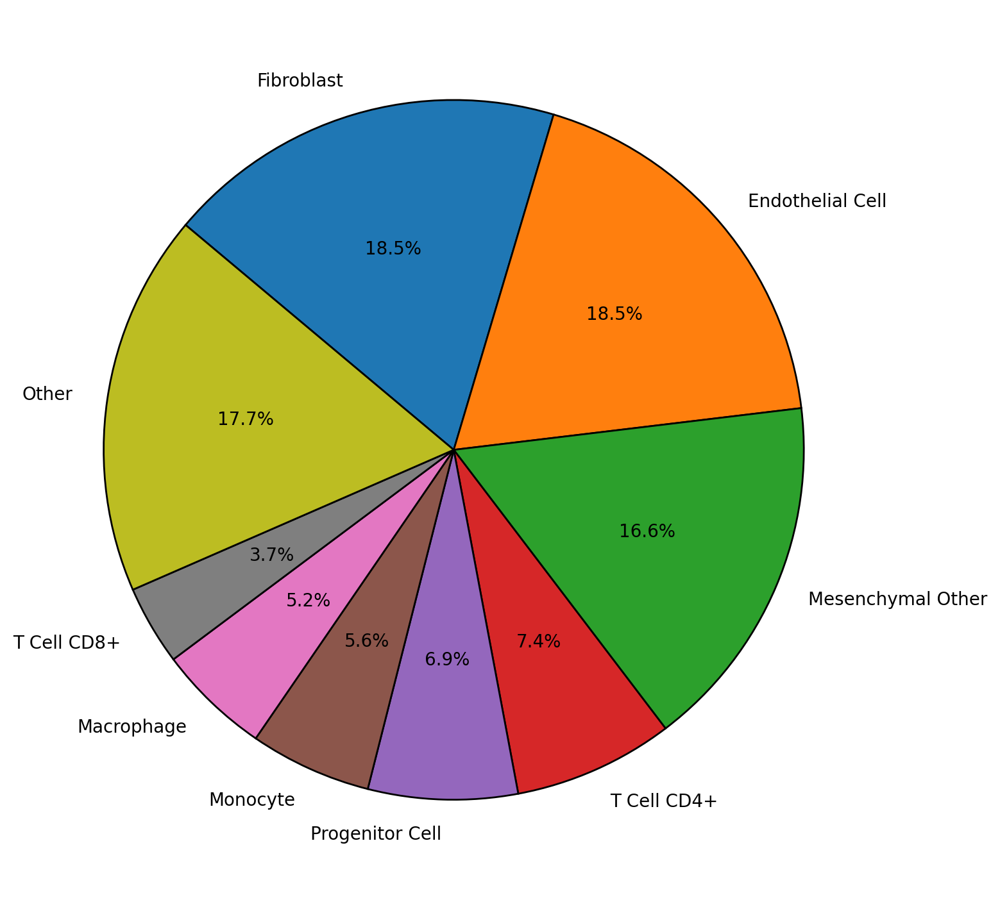

In [36]:
# Group small categories into 'Other'
threshold = 0.03  # 3%
value_counts = adata.obs['cell_type_simplified'].value_counts()
total = value_counts.sum()
mask = (value_counts / total) < threshold

# Create new series
value_counts_grouped = value_counts.copy()
value_counts_grouped[mask] = 0
value_counts_grouped['Other'] = value_counts[mask].sum()
value_counts_grouped = value_counts_grouped[value_counts_grouped > 0]

# Plot
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 8, 8

value_counts_grouped.plot.pie(
    autopct='%1.1f%%',
    startangle=140,
    counterclock=False,
    wedgeprops={'linewidth': 1, 'edgecolor': 'k'}
)
plt.ylabel('')
plt.tight_layout()
plt.show()

# Feature Engineering

Number of genes before HVG selection: 43442


/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


Number of genes after HVG selection: 4546


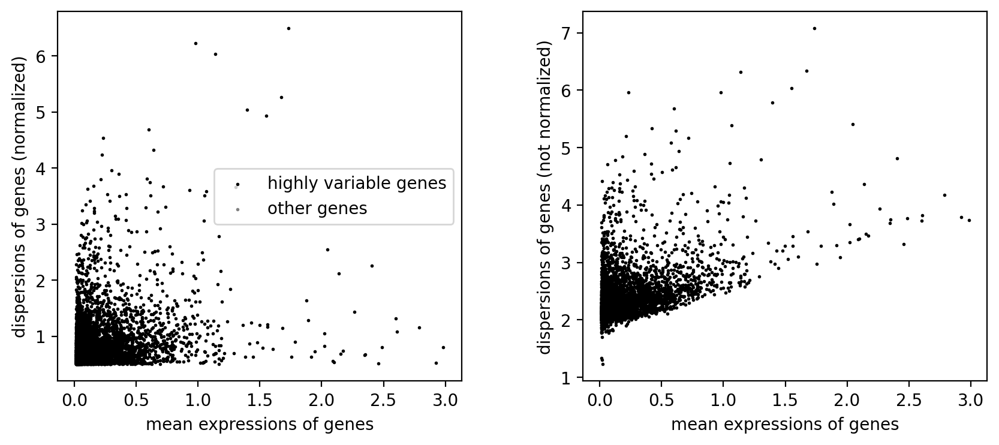

AnnData object with n_obs × n_vars = 1081487 × 4546
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int', 'n_counts', 'n_genes', 'cell_type_simplified'
    var: 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [12]:
adata.raw = adata  # keep full dimension safe
print(f"Number of genes before HVG selection: {adata.n_vars}")

rsc.pp.highly_variable_genes(
    adata, 
    batch_key="basename",
)

adata = adata[:, adata.var['highly_variable']].copy()

print(f"Number of genes after HVG selection: {adata.n_vars}")

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 4
sc.pl.highly_variable_genes(
    adata
)

adata

In [13]:
sc.logging.print_memory_usage()
print_memory_usage()

Memory usage: current 96.38 GB, difference +49.52 GB
[2025-04-04 12:34:06] Memory Report:
  • RAM used:     133.78 GB
  • GPU RAM used: 0.00 GB


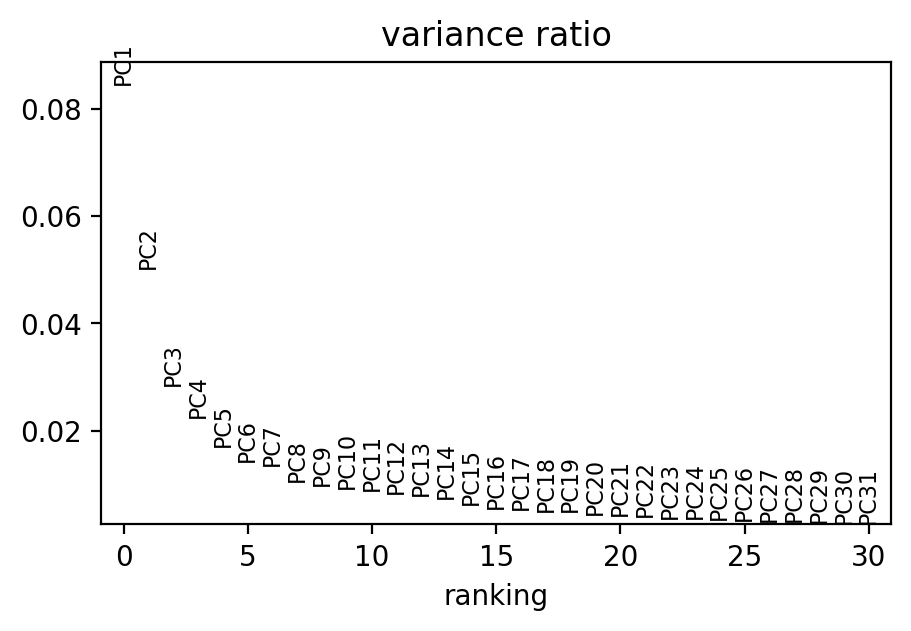

AnnData object with n_obs × n_vars = 1081487 × 4546
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int', 'n_counts', 'n_genes', 'cell_type_simplified'
    var: 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg', 'pca'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'counts'

In [14]:
rsc.pp.pca(
    adata,
)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 5, 3
sc.pl.pca_variance_ratio(
    adata
)

adata

# Embedding

[2025-04-04 12:35:03.254] [CUML] [debug] n_neighbors=15
[2025-04-04 12:35:03.255] [CUML] [debug] Calling knn graph run
[2025-04-04 12:35:03.255] [CUML] [debug] Done. Calling fuzzy simplicial set
[2025-04-04 12:35:03.506] [CUML] [debug] Done. Calling remove zeros


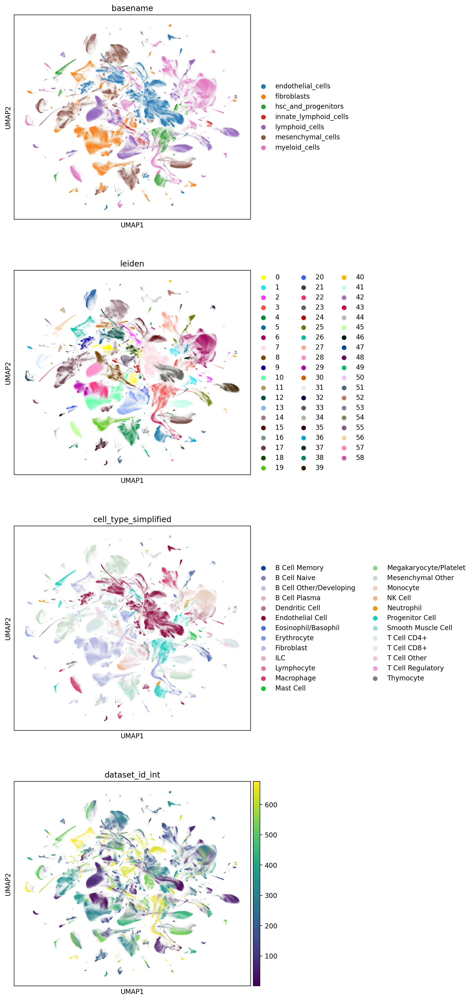

In [15]:
rsc.pp.neighbors(
    adata,
)

rsc.tl.umap(
    adata,
)

rsc.tl.leiden(
    adata,
    resolution=0.35,
)

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 6, 6

sc.pl.umap(
    adata,
    ncols=1,
    color=['basename', 'leiden', 'cell_type_simplified', 'dataset_id_int']
)


In [16]:
sc.logging.print_memory_usage()
print_memory_usage()

Memory usage: current 98.33 GB, difference +1.94 GB
[2025-04-04 12:35:48] Memory Report:
  • RAM used:     134.68 GB
  • GPU RAM used: 0.00 GB


# scVI

In [17]:
adata

AnnData object with n_obs × n_vars = 1081487 × 4546
    obs: 'soma_joinid', 'dataset_id', 'assay', 'assay_ontology_term_id', 'cell_type', 'cell_type_ontology_term_id', 'development_stage', 'development_stage_ontology_term_id', 'disease', 'disease_ontology_term_id', 'donor_id', 'is_primary_data', 'observation_joinid', 'self_reported_ethnicity', 'self_reported_ethnicity_ontology_term_id', 'sex', 'sex_ontology_term_id', 'suspension_type', 'tissue', 'tissue_ontology_term_id', 'tissue_type', 'tissue_general', 'tissue_general_ontology_term_id', 'raw_sum', 'nnz', 'raw_mean_nnz', 'raw_variance_nnz', 'n_measured_vars', 'basename', 'dataset_id_int', 'n_counts', 'n_genes', 'cell_type_simplified', 'leiden'
    var: 'n_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'leiden', 'basename_colors', 'leiden_colors', 'cell_type_simplified_colors'
    obsm: 'X_

In [18]:
scvi.model.SCVI.setup_anndata(
    adata, 
    layer="counts",
    batch_key="dataset_id",
    labels_key='cell_type_simplified',
)

model = scvi.model.SCVI(
    adata,
    n_layers=2,
    n_latent=24,
    gene_likelihood="nb",
)

model.train(
    max_epochs=100,
    accelerator="gpu",
    devices="auto",
    enable_model_summary=True,
    batch_size=1000,
    early_stopping=True,
    early_stopping_patience=2,
    early_stopping_monitor='validation_loss',
)

adata.obsm["X_scVI"] = model.get_latent_representation()

/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/scvi/data/fields/_dataframe_field.py:187: UserWarning: Category 119 in adata.obs['_scvi_batch'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/l ...
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Light

Training:   0%|          | 0/100 [00:00<?, ?it/s]

Monitored metric validation_loss did not improve in the last 2 records. Best score: 848.578. Signaling Trainer to stop.


[2025-04-04 12:41:34.454] [CUML] [debug] n_neighbors=150
[2025-04-04 12:41:34.454] [CUML] [debug] Calling knn graph run
[2025-04-04 12:41:34.454] [CUML] [debug] Done. Calling fuzzy simplicial set
[2025-04-04 12:41:36.283] [CUML] [debug] Done. Calling remove zeros


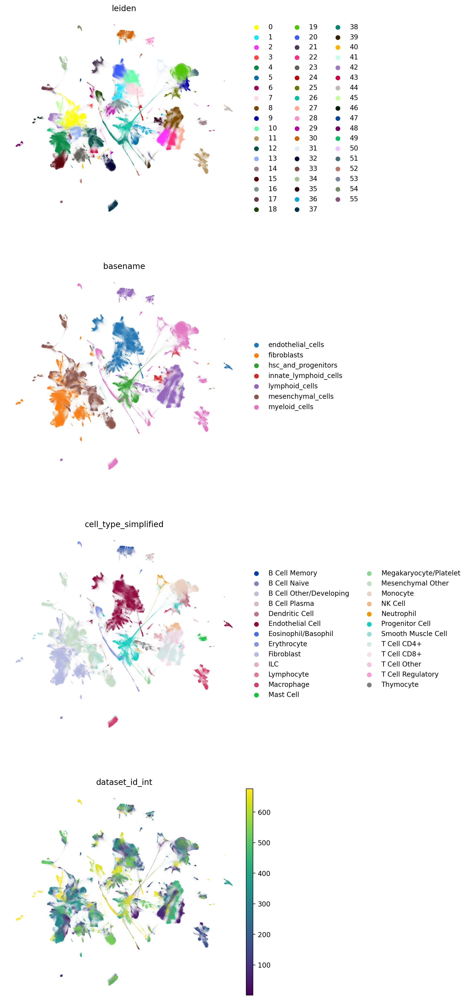

In [19]:
rsc.pp.neighbors(adata, use_rep="X_scVI", n_neighbors=150)
rsc.tl.leiden(adata)

rsc.tl.umap(adata)

sc.pl.umap(
    adata,
    color=["leiden", "basename", "cell_type_simplified", "dataset_id_int"],
    frameon=False,
    ncols=1,
)

In [20]:
sc.logging.print_memory_usage()
print_memory_usage()

Memory usage: current 103.97 GB, difference +5.64 GB
[2025-04-04 12:44:16] Memory Report:
  • RAM used:     142.03 GB
  • GPU RAM used: 0.02 GB


# scANVI

In [21]:
scanvi_model = scvi.model.SCANVI.from_scvi_model(
    model,
    adata=adata,
    labels_key="cell_type_simplified",
    unlabeled_category="Unknown",
)

scanvi_model.train(
    max_epochs=20, 
    n_samples_per_label=100,
    accelerator="gpu",
    devices="auto",
    enable_model_summary=True,
    batch_size=1000,
    early_stopping=True,
    early_stopping_patience=2,
    early_stopping_monitor='validation_loss',
)

adata.obsm['X_scANVI'] = scanvi_model.get_latent_representation(adata)

/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/scvi/data/fields/_dataframe_field.py:187: UserWarning: Category 119 in adata.obs['_scvi_batch'] has fewer than 3 cells. Models may not train properly.
  categorical_mapping = _make_column_categorical(


INFO     Training for 20 epochs.                                                                                   


/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/l ...
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
/nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/lib/python3.12/site-packages/lightning/fabric/plugins/environments/slurm.py:204: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /nfs/turbo/umms-indikar/Cooper/conda_envs/scrapids/l ...
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-bffcf947-2035-5281-9af9-cb80e2ba802c]

  | Name            | Type                | Params | Mode 
-------

Training:   0%|          | 0/20 [00:00<?, ?it/s]

Monitored metric validation_loss did not improve in the last 2 records. Best score: 888.267. Signaling Trainer to stop.


[2025-04-04 12:48:06.672] [CUML] [debug] n_neighbors=150
[2025-04-04 12:48:06.672] [CUML] [debug] Calling knn graph run
[2025-04-04 12:48:06.672] [CUML] [debug] Done. Calling fuzzy simplicial set
[2025-04-04 12:48:08.529] [CUML] [debug] Done. Calling remove zeros


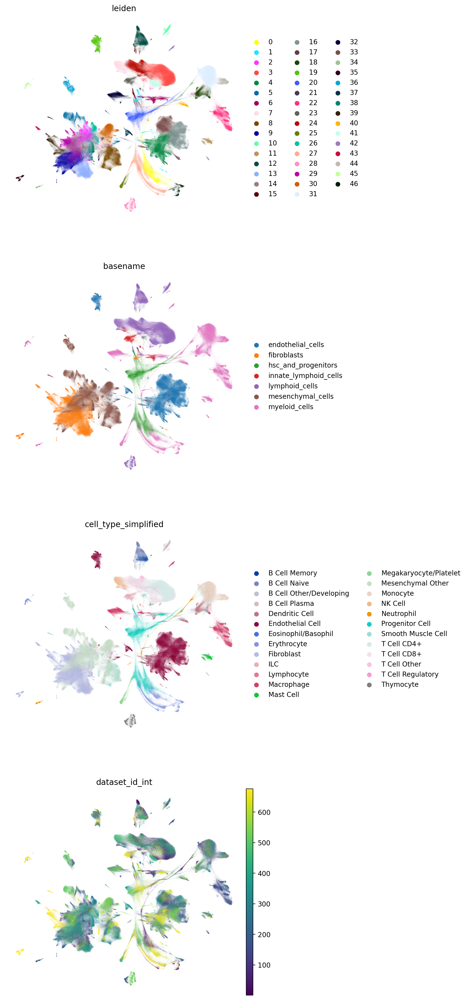

In [22]:
rsc.pp.neighbors(adata, use_rep='X_scANVI', n_neighbors=150)
rsc.tl.leiden(adata)

rsc.tl.umap(adata)

sc.pl.umap(
    adata,
    color=["leiden", "basename", "cell_type_simplified", "dataset_id_int"],
    frameon=False,
    ncols=1,
)

In [23]:
sc.logging.print_memory_usage()
print_memory_usage()

Memory usage: current 98.53 GB, difference -5.43 GB
[2025-04-04 12:50:56] Memory Report:
  • RAM used:     136.21 GB
  • GPU RAM used: 0.03 GB


In [24]:
adata.var.head()

,n_counts,n_cells,highly_variable,means,dispersions,dispersions_norm,highly_variable_nbatches,highly_variable_intersection
feature_name,,,,,,,,
TSPAN6,322077.0,96636,True,0.203263,2.296064,0.826852,4,False
TNMD,32238.0,12030,True,0.043172,2.515914,1.094200,2,False
GCLC,158987.0,89665,True,0.215262,2.143084,0.635908,2,False
ANKIB1,333681.0,164725,True,0.427105,2.172065,0.506647,4,False
HS3ST1,122797.0,37336,True,0.095891,2.284355,0.831745,3,False


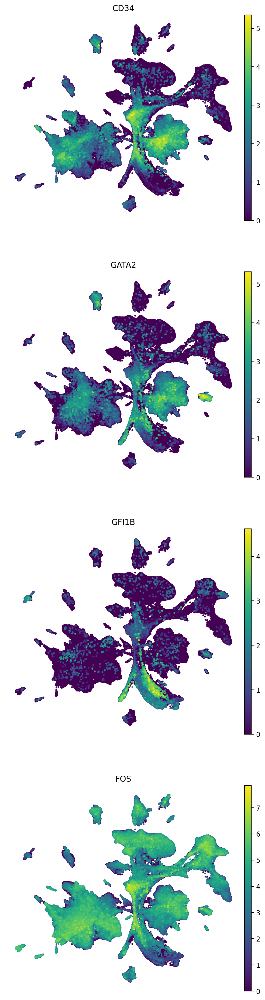

In [25]:
sc.pl.umap(
    adata,
    color=['CD34', 'GATA2', 'GFI1B', 'FOS'],
    frameon=False,
    size=30,
    ncols=1,
)

# differential gene expression

In [26]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

In [ ]:
# deg = scanvi_model.differential_expression(
#     adata,
#     groupby='cell_type_simplified',
#     batch_correction=True,
#     filter_outlier_cells=True,
# )

# deg = deg.reset_index()

In [ ]:
# rsc.tl.rank_genes_groups_logreg(
#     adata,
#     groupby='basename',
# )


# df = sc.get.rank_genes_groups_df(
#     adata,
#     group=None,
# )

# df.head()


In [ ]:
rsc.__version__